<a href="https://moodle.mimuw.edu.pl/pluginfile.php/270319/mod_resource/content/6/SML_2023_project_1.pdf">Treść zadania</a>

Task configuration

In [1]:
"""Main libraries"""
from IPython.display import display
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.subplots as ps
import plotly.graph_objects as go
from scipy.stats import norm, kendalltau, chi2_contingency, mannwhitneyu
import statsmodels.api as sm
from statsmodels.stats.diagnostic import linear_rainbow, het_breuschpagan
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import ttest_ind, ttest_1samp, pearsonr, ks_2samp, kstest, normaltest
from scipy.stats import probplot
from statsmodels.stats.multitest import multipletests

"""For preety prints"""
import json
from pprint import pprint
from pygments import highlight, lexers, formatters

**Task 1**

Code to load data and get basic information:

In [2]:
df = pd.read_csv('earnings.csv', sep=';')
print(f"There are {df.shape[0]} observations in the sample.")
print(f"Dataset contains following columns: {df.columns.values.tolist()}")
print(f"Total number of null values is {np.sum(df.isnull().sum().values)}.")
df

There are 11000 observations in the sample.
Dataset contains following columns: ['id', 'base', 'bonus', 'overtime_pay', 'other', 'sector', 'section_07', 'sex', 'education', 'contract', 'age', 'duration_total', 'duration_entity', 'duration_nominal', 'duration_overtime']
Total number of null values is 0.


,id,base,bonus,overtime_pay,other,sector,section_07,sex,education,contract,age,duration_total,duration_entity,duration_nominal,duration_overtime
0,192064,26651.53,0.00,0.00,0.00,1,3,2,4,1,49,33.03,7.06,1524.15,0.0
1,25495,40168.50,1500.00,0.00,3414.32,1,2,1,1,1,36,10.07,6.01,1562.40,0.0
2,142164,20134.80,0.00,0.00,1700.41,1,2,2,4,1,52,28.08,19.05,1816.00,0.0
3,198034,16475.00,0.00,0.00,1305.00,1,2,2,5,1,55,35.07,11.01,1816.00,0.0
4,144990,34797.60,0.00,1893.35,3118.73,1,2,2,2,1,50,27.00,19.01,722.80,63.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,41597,36573.22,1323.65,1276.80,3337.32,1,2,2,2,1,50,27.02,27.02,766.80,40.0
10996,120022,28280.00,5470.00,0.00,2385.13,1,1,2,4,1,41,18.08,15.09,1792.00,0.0
10997,41800,109316.96,0.00,0.00,9042.58,1,1,2,2,1,47,20.02,1.07,1656.00,0.0
10998,153849,57721.35,6950.00,0.00,4906.32,1,1,2,2,1,47,28.01,21.10,1784.00,0.0


- There are 11000 observations in the sample.
- Dataset contains following quantitative columns:
  - base
  - bonus
  - overtime_pay
  - other
  - age
  - duration_total
  - duration_entity
  - duration_nominal
  - duration_overtime
- Dataset contains following qualitative columns:
  - sector
  - section_07
  - sex
  - education
  - contract
- Dataset also contains column id but it is just unique index.
- Data set does not contain missing data (null values).

In [3]:
# Descriptive statistics for quantitative columns
quantitative_columns = ['base', 'bonus', 'overtime_pay', 'other', 'age', 'duration_total', 'duration_entity', 'duration_nominal', 'duration_overtime']
quantitative_data = df[quantitative_columns]
quantitative_data.describe()

,base,bonus,overtime_pay,other,age,duration_total,duration_entity,duration_nominal,duration_overtime
count,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000,11000.00000,11000.000000,11000.000000,11000.000000
mean,33376.738065,2128.486176,1679.273923,2477.625815,42.470182,18.56708,11.401382,1301.307435,47.702325
std,19276.551638,4966.444726,5407.964344,3715.419120,10.012140,10.99695,9.322181,540.189234,111.963867
min,10.000000,0.000000,0.000000,0.000000,19.000000,0.01000,0.010000,12.800000,0.000000
25%,20995.115000,0.000000,0.000000,0.000000,34.000000,9.03000,3.070000,766.800000,0.000000
50%,31341.245000,620.000000,0.000000,2141.820000,43.000000,19.03500,9.100000,1591.900000,0.000000
75%,41348.290000,2940.717500,1139.330000,3497.430000,51.000000,27.11000,18.040000,1768.000000,40.000000
max,241624.390000,258061.000000,228110.340000,88555.760000,77.000000,57.02000,46.010000,2024.000000,1812.580000


In [4]:
indices = {
    'sector': {
        1: 'public', 
        2: 'private'
    },
    'section_07': {
        1: 'Public Administration and Defence; Compulsory Social Security',
        2: 'Education',
        3: 'Human Health and Social Work Activities'
    },
    'sex': {
        1: 'man',
        2: 'woman'
    },
    'education': {
        1: 'doctorate', 
        2: 'higher',
        3: 'post-secondary', 
        4: 'secondary', 
        5: 'basic vocational',
        6: 'middle school and below'
    },
    'contract': {
        1: 'for an indefinite period', 
        2: 'for a definite period'
    }
}

frequency_tables = {
    column: df[column].value_counts().rename(index=idx).to_dict() for column, idx in indices.items()
}

def preety_print(dict_arg):
    print(highlight(json.dumps(dict_arg, indent=4), lexers.JsonLexer(), formatters.Terminal256Formatter(style="github-dark")))

preety_print(frequency_tables)

{
    "sector": {
        "public": 10548,
        "private": 452
    },
    "section_07": {
        "Education": 5867,
        "Human Health and Social Work Activities": 2732,
        "Public Administration and Defence; Compulsory Social Security": 2401
    },
    "sex": {
        "woman": 8289,
        "man": 2711
    },
    "education": {
        "higher": 6633,
        "secondary": 1983,
        "basic vocational": 906,
        "post-secondary": 680,
        "doctorate": 430,
        "middle school and below": 368
    },
    "contract": {
        "for an indefinite period": 9306,
        "for a definite period": 1694
    }
}



There is a lot more employees in public sector. Most of section_07 are in Education. Most employees are woman. Most employees have higher education and a very little have middle school and below education and a lot of people have contract for indefinite period.

**Histograms**

In [5]:
grid_shape = (3, 3)
grid = [(i, j) for i in range(1, grid_shape[0] + 1) for j in range(1, grid_shape[1] + 1)]

def make_histogram(columns, grid, transform=lambda x: x, df=df):
    fig = ps.make_subplots(rows=grid_shape[0], cols=grid_shape[1])
    fig.update_layout(height=600, width=800)

    for (i, j), col in zip(grid, columns):
        value = transform(df[col])
        standard = (value - value.mean()) / value.std()
        
        fig.add_trace(
            go.Histogram(
                x=standard, 
                name=col, 
                histnorm='probability density'
            ), 
            row=i, 
            col=j
        )
        
        x = np.linspace(standard.min(), standard.max(), 100)
        fig.add_trace(
            go.Scatter(
                x=x,
                y=norm.pdf(x, 0, 1),
                mode='lines',
                name='gauss',
                line={'color': 'red'},
                showlegend=False
            ), 
            row=i, 
            col=j
        )

    fig.show()
    
make_histogram(quantitative_columns, grid)

**Histogram log**

In [6]:
make_histogram(quantitative_columns, grid, lambda x: np.log(x + 1))

Now I will analyze if the distribution of variable is close to normal or log-normal distribution plotting the data or the logarithm or data without extreme values that makes plots less informative.

**qqplots**

In [7]:
fig = ps.make_subplots(rows=grid_shape[0], cols=grid_shape[1])
fig.update_layout(height=600, width=800)

for (i, j), col in zip(grid, quantitative_columns):
    quantiles = np.linspace(0.01, 0.99, 100)
    x = norm.ppf(quantiles, loc=np.mean(df[col]), scale=np.std(df[col]))
    
    fig.add_trace(
        go.Scatter(
            x=x, 
            y=np.quantile(df[col], quantiles), 
            mode='markers', 
            name=col, 
            showlegend=True
        ), 
        row=i, 
        col=j
    )
    
    fig.add_trace(
        go.Scatter(
            x=x, 
            y=x, 
            mode='lines',
            name=f'{col} diagonal',
            line={'color': 'red'}, 
            showlegend=False
        ), 
        row=i, 
        col=j
    )

fig.show()

Variables base, age and maybe duration_total seems to be close to normal distribution, other variables do not.
Taking logarithm does not improve this much (considering all values, there can be outliers that makes data have such distributions but I do not check it here)

**Task 2**

I computed and visualized Kendall correlation coefficients for quantitative data becouse it doesn't require specyfic distributions and is immune to outliers. It seems that all relationships between this data are significant becouse the p-values are really low.

In [8]:

n = len(quantitative_columns)
correlation_coefficients = np.ones((n, n))
max_p_value = 0
p_values = []

for i in range(n):
    for j in range(i + 1, n):
        correlation_coefficient, p_value = kendalltau(df[quantitative_columns[i]], df[quantitative_columns[j]])
        correlation_coefficients[i, j] = correlation_coefficient
        correlation_coefficients[j, i] = correlation_coefficient
        p_values.append(p_value)
        if p_value > max_p_value:
            max_p_value = p_value

correlation_matrix = pd.DataFrame(index=quantitative_columns, columns=quantitative_columns, data=correlation_coefficients)
fig = px.imshow(correlation_matrix, x=quantitative_columns, y=quantitative_columns, color_continuous_scale='Jet', zmin=-1, zmax=1)
fig.update_layout(title='Kendall tau Correlation Coefficients Heatmap', width=600, height=500)
fig.show()

p_values_corrected = multipletests(p_values, alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)[1]

print(f"The maximal p_value is {np.max(p_values_corrected)} < 0.01 so all the correlations are significant")
        

The maximal p_value is 3.0329373845227792e-05 < 0.01 so all the correlations are significant


In [9]:
qualitative_columns = list(indices.keys())
n = len(qualitative_columns)

for i in range(n):
    for j in range(i + 1, n):
        print("_" * 64)
        print(f"Analysis of associations between {qualitative_columns[i]} and {qualitative_columns[j]}:")
        print("Contigency table:")
        contingency_table = pd.crosstab(df[qualitative_columns[i]], df[qualitative_columns[j]])
        display(contingency_table)
        chi2, p_value, degrees, _ = chi2_contingency(contingency_table)
        P = np.sqrt(chi2 / (chi2 + df.shape[0]))
        print(f"chi2: {chi2}, p_value: {p_value}, degrees of freedom: {degrees}, pearson_coeff: {P}")
        print(f"The dependency is {'' if p_value < 0.01 else 'not '}significant.")
        print(f"The Pearson coefficient is {P} so the relationship {'is very week' if P < 0.02 else 'is not very strong'}.")

________________________________________________________________
Analysis of associations between sector and section_07:
Contigency table:


section_07,1,2,3
sector,,,
1,2395,5701,2452
2,6,166,280


chi2: 376.51486558141704, p_value: 1.741148294279235e-82, degrees of freedom: 2, pearson_coeff: 0.18192251215862765
The dependency is significant.
The Pearson coefficient is 0.18192251215862765 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between sector and sex:
Contigency table:


sex,1,2
sector,,
1,2618,7930
2,93,359


chi2: 3.979425499771631, p_value: 0.046059270149792046, degrees of freedom: 1, pearson_coeff: 0.019016706529988187
The dependency is not significant.
The Pearson coefficient is 0.019016706529988187 so the relationship is very week.
________________________________________________________________
Analysis of associations between sector and education:
Contigency table:


education,1,2,3,4,5,6
sector,,,,,,
1,386,6435,634,1866,872,355
2,44,198,46,117,34,13


chi2: 91.10605566465615, p_value: 3.934881885969482e-18, degrees of freedom: 5, pearson_coeff: 0.09063296612960224
The dependency is significant.
The Pearson coefficient is 0.09063296612960224 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between sector and contract:
Contigency table:


contract,1,2
sector,,
1,8994,1554
2,312,140


chi2: 86.50634876512693, p_value: 1.3928943180816976e-20, degrees of freedom: 1, pearson_coeff: 0.08833374351678683
The dependency is significant.
The Pearson coefficient is 0.08833374351678683 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between section_07 and sex:
Contigency table:


sex,1,2
section_07,,
1,735,1666
2,1490,4377
3,486,2246


chi2: 116.96277760046287, p_value: 3.9981174691047954e-26, degrees of freedom: 2, pearson_coeff: 0.10257245752214636
The dependency is significant.
The Pearson coefficient is 0.10257245752214636 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between section_07 and education:
Contigency table:


education,1,2,3,4,5,6
section_07,,,,,,
1,9,1583,114,559,95,41
2,360,4065,112,597,535,198
3,61,985,454,827,276,129


chi2: 1760.7187359754234, p_value: 0.0, degrees of freedom: 10, pearson_coeff: 0.37145604011759387
The dependency is significant.
The Pearson coefficient is 0.37145604011759387 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between section_07 and contract:
Contigency table:


contract,1,2
section_07,,
1,2204,197
2,4849,1018
3,2253,479


chi2: 122.09157307819385, p_value: 3.0771719334165714e-27, degrees of freedom: 2, pearson_coeff: 0.10477305598582977
The dependency is significant.
The Pearson coefficient is 0.10477305598582977 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between sex and education:
Contigency table:


education,1,2,3,4,5,6
sex,,,,,,
1,252,1628,79,359,307,86
2,178,5005,601,1624,599,282


chi2: 416.86093935921195, p_value: 6.882155246979766e-88, degrees of freedom: 5, pearson_coeff: 0.19108308566926627
The dependency is significant.
The Pearson coefficient is 0.19108308566926627 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between sex and contract:
Contigency table:


contract,1,2
sex,,
1,2213,498
2,7093,1196


chi2: 24.04999884093461, p_value: 9.386631884816147e-07, degrees of freedom: 1, pearson_coeff: 0.04670753444496185
The dependency is significant.
The Pearson coefficient is 0.04670753444496185 so the relationship is not very strong.
________________________________________________________________
Analysis of associations between education and contract:
Contigency table:


contract,1,2
education,,
1,291,139
2,5519,1114
3,602,78
4,1771,212
5,796,110
6,327,41


chi2: 158.77494930779181, p_value: 1.8056322519626752e-32, degrees of freedom: 5, pearson_coeff: 0.11928414774348876
The dependency is significant.
The Pearson coefficient is 0.11928414774348876 so the relationship is not very strong.


**Task 3**

Scatter plots for the variables related to the salary structure against the duration of employment in the reporting entity.

Some of the variables has extremely big single values (outliers) so I provided additional plots without them.

In [10]:
salary_variables = ['base', 'bonus', 'overtime_pay', 'other']

grid = [(1, 1), (1, 2), (2, 1), (2, 2)]
fig = ps.make_subplots(rows=2, cols=2)
fig.update_layout(height=600, width=1200)

for (i, j), col in zip(grid, salary_variables):
    fig.add_trace(
        go.Scatter(
            x=df['duration_entity'], 
            y=df[col], 
            mode='markers', 
            name=col, 
            showlegend=True
        ), 
        row=i, 
        col=j
    )

fig.update_layout(title="Scatter plots for the variables related to the salary structure against the duration of employment in the reporting entity")
fig.show()

Boxplots for base variable (all values and values less or equal to some threshold)

This box plots has a lot of single big values (especially bonus one) so we can also draw boxplots for bounded data to see what the boxplot presents better.

In [11]:
tickvals = list(indices['contract'].keys())
ticktext = list(indices['contract'].values())

def box_plot(variable, title, bound = lambda data: data):
    fig = go.Figure()
    fig.add_trace(go.Box(y=bound(df[df['contract'] == tickvals[0]][variable]), name=ticktext[0], marker_color="#ff4422"))
    fig.add_trace(go.Box(y=bound(df[df['contract'] == tickvals[1]][variable]), name=ticktext[1], marker_color="#22ff44"))
    fig.update_layout(title=title)
    fig.show()
    
box_plot('base', "Box plot for base values")
# Additional plots below
box_plot('base', "Box plot for base bounded by 70k", lambda data: data[data < 70000])
box_plot('bonus', "Box plot for bonus")
box_plot('bonus', "Box plot for bonus bounded by 200k (outlier removed)", lambda data: data[data < 200000])
box_plot('bonus', "Box plot for bonus bounded by 10k (more representative)", lambda data: data[data < 10000])

A heatmap of the (appropriate!) correlation coefficients among the quantitative variables in the dataset

In [12]:
px.imshow(quantitative_data.corr(method="kendall"), color_continuous_scale='Jet', zmin=-1)

Additional plots for qualitative data. Violin for education column becouse its qualitative value with more than 3 possible values so it is very descriptive.

In [13]:
fig = px.violin(df['education'], y='education')
tickvals = list(indices['education'].keys())
ticktext = list(indices['education'].values())
fig.update_yaxes(tickvals=tickvals, ticktext=ticktext)
fig.show()

Histograms for other qualitative values

In [14]:
def add_subplot(fig, column, x, y, df=df):
    tickvals = list(indices[column].keys())
    ticktext = list(indices[column].values())
    fig.add_trace(go.Histogram(x=df[column], name=column), x, y)
    fig.update_xaxes(tickvals=tickvals, ticktext=ticktext, row=x, col=y)

fig = ps.make_subplots(rows=2, cols=2)
add_subplot(fig, "contract", 1, 1)
add_subplot(fig, "sex", 1, 2)
add_subplot(fig, "sector", 2, 1)
add_subplot(fig, "section_07", 2, 2)
fig.update_layout(width=800, height=800)
fig.show()

This are some histograms showing count of people with total of base salaries by the sex. There are a lot more woman in the dataframe than man but there are not so much woman with high salaries (arbitrary thresholds below).

In [15]:
fig = go.Figure()
for k, label in indices['sex'].items():
    fig.add_trace(go.Histogram(x=df[(df['sex'] == k) & (df['base'] >= 1e5)]['base'], name=label, nbinsx=10))
fig.update_layout(title="People with high base salary depending on sex")
fig.show()

fig = go.Figure()
for k, label in indices['sex'].items():
    fig.add_trace(go.Histogram(x=df[(df['sex'] == k) & (df['base'] >= 6e4) & (df['base'] < 1e5)]['base'], name=label, nbinsx=10))
fig.update_layout(title="People with average base salary depending on sex")
fig.show()

fig = go.Figure()
for k, label in indices['sex'].items():
    fig.add_trace(go.Histogram(x=df[(df['sex'] == k) & (df['base'] < 6e4)]['base'], name=label, nbinsx=10))
fig.update_layout(title="People with low base salary depending on sex")
fig.show()

**Task 4**

I made assumptions that distribution is normally distributed and we do not know the true variance and mean. This assumptions seems justifiable as this data is from database with a lot of data and usually such data of random person age is distributed normally. The test for normality fails but we see that its similar to normal from excercise 1.

My median estimation is from this link and there are no additional assumptions <a href="https://www.statology.org/confidence-interval-for-median/">Confidence interval for median source</a>


In [16]:
from scipy.stats import t, chi2

alpha = 0.01
assert 1 - alpha == 0.99
age = df['age']

# H0: data is normally distributed
# H1: data is not normally distributed
p_value = normaltest(age)[1]
alpha = 0.05
if p_value < alpha:
    print("The hypothesis that data is normal was rejected")
else:
    print("The data may be normal (not rejected)")

# In normal distribution it would be 0
print(f"Kurthosis: {age.kurtosis()}, skewness: {age.skew()}")

dof = len(age) - 1
mu_hat = age.mean()
std_hat = age.std(ddof=1)
var_hat = age.var(ddof=1)

margin = t.ppf(1 - alpha / 2, dof) * std_hat / np.sqrt(dof)
mean_interval = mu_hat - margin, mu_hat + margin
lower_var = dof * var_hat / chi2.ppf(1 - alpha / 2, dof)
upper_var= dof * var_hat / chi2.ppf(alpha / 2, dof)
var_interval = lower_var, upper_var

print(f"Confidence interval for mean: {mean_interval}")
print(f"Confidence interval for variance: {var_interval}")

print(f"Sample median: {age.median()}")
z_score = norm.ppf(1 - alpha / 2)
round_float = lambda x: int(np.floor(x + 0.5))
n = len(age)
j = n * 0.5 - 0.5 * z_score * np.sqrt(n)
k = n * 0.5 + 0.5 * z_score * np.sqrt(n)
j, k = round_float(j), round_float(k)
age_sorted = age.agg('sort')
median_interval = age_sorted[j], age_sorted[k]
print(f"Confidence interval for median {median_interval}")

The hypothesis that data is normal was rejected
Kurthosis: -0.9107188149866849, skewness: -0.07734328504918418
Confidence interval for mean: (42.2830506168912, 42.65731301947244)
Confidence interval for variance: (97.64546920154429, 102.94597326497434)
Sample median: 43.0
Confidence interval for median (43, 43)


**Task 5**

In [17]:
alpha = 0.01
get_key = lambda k, d: list(filter(lambda x: d[x] == k, d))[0]

# Null Hypothesis (H0): There are no significant differences between the base salary of the employees of the public and private sector.
# Alternative Hypothesis (H1): There are significant differences between the base salary of the employees of the public and private sector.
# I assume independence of samples becouse these sectors are different.
# I use U Mann-Whitney's test becouse it doesn't require normality and equality of variance
public_id, private_id = get_key('public', indices['sector']), get_key('private', indices['sector']), 
public_base = df[df['sector'] == public_id]['base'].values
private_base = df[df['sector'] == private_id]['base'].values

p_value = mannwhitneyu(x=public_base, y=private_base, alternative='two-sided')[1]
if p_value < alpha:
    print("There are significant differences between the base salary of the employees of the public and private sector. (rejected null hypothesis)")
else:
    print("Failed to reject the hypothesis that are no significant differences between the base salary of the employees of the public and private sector.")

# Null Hypothesis (H0): Among employees that are younger than 30 years old, the mean total duration of the
# employment is equal to the mean total duration of the employment in the reporting entity.
# Alternative Hypothesis (H1): Among employees that are younger than 30 years old, the mean total duration of the
# employment is not equal to the mean total duration of the employment in the reporting entity.
# The one-sample t-test is a standard statistical method widely used for comparing sample and population mean. 
young = df[df['age'] < 30] 
young_total = young['duration_total']
young_entity = young['duration_entity']
young_difference = young_total - young_entity
reporting_entity_duration_mean = young_entity.mean()

p_value = ttest_1samp(young_difference, 0)[1]
if p_value < alpha:
    print("Among employees that are younger than 30 years old, the mean total duration of the employment is not equal... (rejected null hypothesis)")
else:
    print("Failed to reject the null hypothesis.")

# Null Hypothesis (H0): A shorter total duration of the employment is not correlated with the longer time actually worked overtime.
# Alternative Hypothesis (H1): A shorter total duration of the employment is correlated with the longer time actually worked overtime.
# Justification below
total_duration = df['duration_total']
overtime_duration = df['duration_overtime']
correlation_coefficient, p_value = kendalltau(total_duration, overtime_duration)

alpha = 0.01

if p_value < alpha and correlation_coefficient < 0:
    print("A shorter total duration of the employment is correlated with the longer time actually worked overtime (rejected null hypothesis).")
else:
    print("Failed to reject the null hypothesis. Shorter total duration of the employment may not be correlated with the longer time actually worked overtime.")


# Justification
px.scatter(df, x='duration_overtime', y='duration_total', trendline='ols')
# The relation looks linear but there is visible heteroscedasticity so the variance isn't constant across all levels of predictors variables.
# This is the reason I use rank correlation. Multiple tied ranks problem may occur for the data visualised above so I use Kendall tau.


There are significant differences between the base salary of the employees of the public and private sector. (rejected null hypothesis)
Among employees that are younger than 30 years old, the mean total duration of the employment is not equal... (rejected null hypothesis)
A shorter total duration of the employment is correlated with the longer time actually worked overtime (rejected null hypothesis).


**Task 6**

In [18]:
# Null Hypothesis (H0): Sector and coded variables are independent.
# Alternative Hypothesis (H1): Sector and coded variables are dependent.
q = df['duration_total'].quantile(np.arange(1., 4) / 4)
def encode(duration_total):
    if duration_total <= q[1/4]:
        return 'low'
    elif q[1 / 4] < duration_total <= q[3 / 4]:
        return 'medium'
    else:
        return 'high'
    
    
# Assumption: Expected value of counts should be greater than 5 in at least 80% cells
ct = [pd.crosstab(pd.qcut(df[df['sector']==1]['age'], 4), df[df['sector']==1]['duration_total'].apply(encode)),
    pd.crosstab(pd.qcut(df[df['sector']==2]['age'], 4), df[df['sector']==2]['duration_total'].apply(encode))]

Ect = pd.DataFrame(np.outer(ct[0].sum(axis=1), ct[0].sum(axis=0)) / ct[0].sum().sum(), 
                        index=ct[0].index, 
                        columns=ct[0].columns)

coded_variable = df['duration_total'].apply(encode)
crosstab = pd.crosstab(df['sector'], coded_variable)
p_value = chi2_contingency(crosstab)[1]

display(Ect) # its greater in fact as we see.

alpha = 0.01

if p_value < alpha:
    print("Sector and coded variables are dependent (rejected null hypothesis)")
else:
    print("Failed to reject the null hypothesis.")

admin_id = get_key('Public Administration and Defence; Compulsory Social Security', indices['section_07'])
admin_section = df[df['section_07'] == admin_id]
other_sections = df[df['section_07'] != admin_id]

# Kolmogorov-Smirnov test only assumes continuity so I use it on continuous distribution variables below.
# As it is multiple testing we should use the Benjamini-Hochberg fix
# as I did some tasks before.
for component in salary_variables:
    p_value = ks_2samp(admin_section[component], other_sections[component])[1]
    
    if p_value < alpha:
        print(f"{component}: Distributions are different (rejected null hypothesis)")
    else:
        print(f"{component}: Failed to reject null hypothesis.")

# Kolmogorov-Smirnov test as goodness of fit
lam = 10
p_value = kstest(df['duration_total'], 'expon', args=(0, 1/lam))[1]

if p_value < alpha:
    print("duration_total doesn't follow the Exp(10) distribution (rejected null hypothesis)")
else:
    print("Failed to reject null hypothesis..")

duration_total,high,low,medium
age,,,
"(18.999, 34.0]",668.003223,657.874289,1345.122488
"(34.0, 43.0]",696.013841,685.460182,1401.525976
"(43.0, 51.0]",690.511756,680.041524,1390.446720
"(51.0, 77.0]",583.471179,574.624005,1174.904816


Sector and coded variables are dependent (rejected null hypothesis)
base: Distributions are different (rejected null hypothesis)
bonus: Distributions are different (rejected null hypothesis)
overtime_pay: Distributions are different (rejected null hypothesis)
other: Distributions are different (rejected null hypothesis)
duration_total doesn't follow the Exp(10) distribution (rejected null hypothesis)


**Task 7**

$R^2$ is 1 becouse the modeled values exactly match the observed values

Individual significance

| variable          | pvalue   |
|-------------------|----------|
| const             | 9.733066e-02  |
| base              | 0.000000e+00  |
| bonus             | 0.000000e+00  |
| overtime_pay      | 0.000000e+00  |
| other             | 0.000000e+00  |
| age               | 2.522053e-22  |
| duration_total    | 1.161891e-24  |
| duration_entity   | 6.954549e-22  |
| duration_nominal  | 1.332595e-49  |
| duration_overtime | 1.076615e-110 |
| sector_2          | 2.661747e-01  |
| section_07_2      | 9.611324e-125 |
| section_07_3      | 2.519591e-30  |
| sex_2             | 4.426045e-05  |
| education_2       | 2.261141e-08  |
| education_3       | 4.984977e-17  |
| education_4       | 2.670911e-01  |
| education_5       | 1.257310e-12  |
| education_6       | 9.657654e-21  |
| contract_2        | 5.718838e-01  |

This means base, bonus, other, overtime_pay are the most significant (becouse total depends on them).
Aksi duration_nominal and duration_overtime are very significant. Duration entity, age and education are also significant
Other variables are not very significant. Sex is highly not significant.

Joint significance is 0 becouse the model explains the variable as it's dependent on column subset.

In [19]:
X = sm.add_constant(df.drop(columns=['id']))
X = pd.get_dummies(X, columns=qualitative_columns, drop_first=True)
Y = pd.DataFrame(X[salary_variables].sum(axis=1), columns=['total'])
model = sm.OLS(Y, X)
results = model.fit()
print(results.summary())
print(results.pvalues)

f_statistic = results.fvalue
p_value = results.f_pvalue

print(f"models F-statistic: {f_statistic}")
print(f"models f_pvalue: {p_value}")


                            OLS Regression Results                            
Dep. Variable:                  total   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.877e+33
Date:                Wed, 03 Jan 2024   Prob (F-statistic):               0.00
Time:                        23:04:36   Log-Likelihood:             2.5987e+05
No. Observations:               11000   AIC:                        -5.197e+05
Df Residuals:                   10980   BIC:                        -5.196e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              2.274e-12   1.37e-1

*Checking assumptions below:*

Assumptions are:
- Linearity: The relationship between X and the mean of Y is linear.
- Homoscedasticity: The variance of residual is the same for any value of X.
- Independence: Observations are independent of each other.
- Normality: For any fixed value of X, Y is normally distributed.

Rainbow test checks linearity becouse it checks if additional term which is higher order does not significally improve the model.

Manually calculate test statistic for homoscedasticity.

VIF is the ratio of variance of a parameter estimate when fitting a model to the variance fitted to one element on its own so it checks if there is mullticollinearity.

The normaltest tests is standard test if sample comes from a normal distribution.


In [20]:

rainbow_p_value = linear_rainbow(results)[1]
linearity_satisfied = rainbow_p_value > 0.05
normal_p_value = normaltest(results.resid)[1]
normality_satisfied = normal_p_value > 0.05
vif = pd.DataFrame()
vif["Variable"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
multicollinearity_satisfied = all(vif["VIF"] < 5)
squared_residuals = results.resid ** 2
squared_model = sm.OLS(squared_residuals, X).fit()
p_value = 1 - chi2.cdf(squared_model.ssr / (2 * X.shape[1]), X.shape[1])
homoscedasticity_satisfied = p_value < 0.05

print(f"The model satisfies linearity: {linearity_satisfied}")
print(f"The model satisfies normality: {normality_satisfied}")
print(f"Independent variables are not much corelated: {multicollinearity_satisfied}")
print(f"The model satisfies homoscendasticity: {homoscedasticity_satisfied}")
vif


The model satisfies linearity: True
The model satisfies normality: False
Independent variables are not much corelated: False
The model satisfies homoscendasticity: False


To make better model I removed higly correlated variables until I got good VIFs.
I also removed outliers from boxplots (i do not show them but i wrote `plt.boxplot(x=better_X[<column name>])` for finding them). Also I removed qualitative variables becouse they doesn't have a chance to fullfill normallity.

The model satisfies linearity: True
The model satisfies normality (*): False
Independent variables are not much corelated: True
The model satisfies homoscendasticity: False
The residual mean is 1.242354905819163e-13


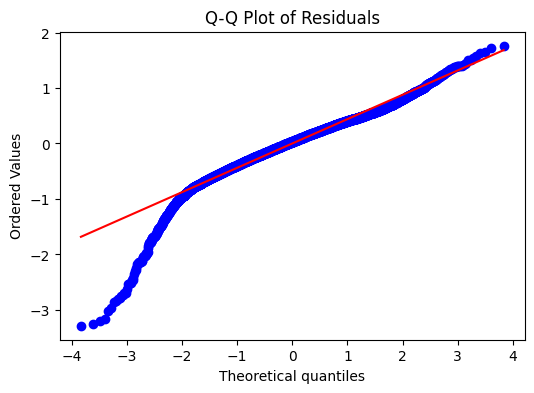

,Variable,VIF
0,duration_nominal,1.407293
1,duration_overtime,1.407293


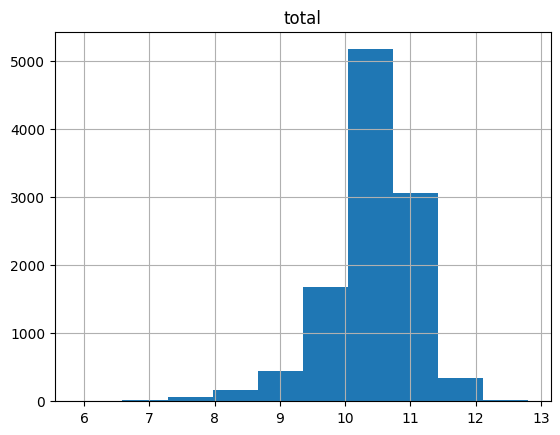

In [21]:
better_X = X.copy()

Y = pd.DataFrame(better_X[salary_variables].sum(axis=1), columns=['total'])
better_X = better_X.drop(columns=salary_variables)
better_X = better_X.drop(columns=['duration_total', 'age', 'duration_entity'])

Y = np.log(Y + 1)
model = sm.OLS(Y, better_X)
results = model.fit()
residuals = results.resid
    
vif = pd.DataFrame()
vif_columns = np.setdiff1d(better_X.columns, ['const','contract_2','education_2','education_3', 'education_4', 'education_5', 'education_6', 'section_07_2', 'section_07_3', 'sector_2', 'sex_2'])

better_X[vif_columns] = np.log(better_X[vif_columns] + 1)

vif_X = better_X[vif_columns]
vif["Variable"] = vif_columns
vif["VIF"] = [variance_inflation_factor(vif_X.values, i) for i in range(vif_X.shape[1])]

rainbow_p_value = linear_rainbow(results)[1]
linearity_satisfied = rainbow_p_value > 0.05
normal_p_value = normaltest(results.resid)[1]
normality_satisfied = normal_p_value > 0.05
multicollinearity_satisfied = all(vif["VIF"] < 5)
homoscedasticity_satisfied = het_breuschpagan(residuals, X)[1] > 0.05

print(f"The model satisfies linearity: {linearity_satisfied}")
print(f"The model satisfies normality (*): {normality_satisfied}")
print(f"Independent variables are not much corelated: {multicollinearity_satisfied}")
print(f"The model satisfies homoscendasticity: {homoscedasticity_satisfied}")


print(f"The residual mean is {residuals.mean()}")

fig, ax = plt.subplots(figsize=(6, 4))
probplot(residuals, dist="norm", plot=ax)
plt.title('Q-Q Plot of Residuals')
plt.show()

Y.hist()
vif

The Y variable is not normal but after logarithm its normal-like like in histogram above.

My model satisfies linearity, has low VIFs of quantitative variables. Residuals sum is almost 0.

However it has problems with homoscedacity and is not perfectly normal what we see on histogram and q-plot.

**interpretation of the individually significant parameters**

In [22]:
coefficients = results.params
print("Coefficients:", coefficients)

Coefficients: const                10.023826
duration_nominal      0.000694
duration_overtime     0.001771
sector_2             -0.120095
section_07_2         -0.022447
section_07_3         -0.075891
sex_2                -0.024778
education_2          -0.278728
education_3          -0.621691
education_4          -0.743871
education_5          -1.075452
education_6          -1.102888
contract_2           -0.552719
dtype: float64


**Education**
The lower the education is the smaller are the earnings what is not suprizing at all ceteris paribus.

**Section_07**
Working in healthcare gets our earnings down comparing to education and administration but working in education also our earnings down compared to administration so the protests may have some sense ceteris paribus.

**Sex**
Being a woman also have negative impact on earnings what is usually happening so it is not suprizing ceteris paribus.

**Contract**
Having contract for a definite period also has negative impact on earnings cateris paribus.

**Sector**
Working in private sector makes (impacts) earnings smaller than working in public sector which is interesting insight becouse I always thought private sector should guarantee better earnings ceteris paribus.

**Duration overtime**
Duration overtime have positive impact on earnings ceteris paribus. I assume its becouse people working for longer time has more experience so earnings are bigger.

**Duration nominal**
Duration nominal also have possitive impact on earnings for the same reason as duration overtime ceteris paribus,

**characteristics of the employees whose salaries belong to 10%
bottom predictions of the total salary**

In [23]:
bottom_preds = df.loc[residuals >= residuals.quantile(0.9)]

frequency_tables_bottom = {
    column: bottom_preds[column].value_counts().rename(index=idx).to_dict() for column, idx in indices.items()
}

print("Bottom frequency tables")
preety_print(frequency_tables_bottom)
print("Orginal data frequency tables")
preety_print(frequency_tables)


Bottom frequency tables
{
    "sector": {
        "public": 1041,
        "private": 59
    },
    "section_07": {
        "Education": 558,
        "Public Administration and Defence; Compulsory Social Security": 279,
        "Human Health and Social Work Activities": 263
    },
    "sex": {
        "woman": 781,
        "man": 319
    },
    "education": {
        "higher": 792,
        "secondary": 141,
        "doctorate": 65,
        "basic vocational": 45,
        "post-secondary": 37,
        "middle school and below": 20
    },
    "contract": {
        "for an indefinite period": 781,
        "for a definite period": 319
    }
}

Orginal data frequency tables
{
    "sector": {
        "public": 10548,
        "private": 452
    },
    "section_07": {
        "Education": 5867,
        "Human Health and Social Work Activities": 2732,
        "Public Administration and Defence; Compulsory Social Security": 2401
    },
    "sex": {
        "woman": 8289,
        "man": 2711
    }

In [24]:
quantitative_bottom = bottom_preds[quantitative_columns]
print("Bottom quantitative")
display(quantitative_bottom.describe())
print("Orginal quantitative")
display(quantitative_data.describe())

Bottom quantitative


,base,bonus,overtime_pay,other,age,duration_total,duration_entity,duration_nominal,duration_overtime
count,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000
mean,58995.915973,4622.931173,1203.483236,4921.864555,45.867273,21.617218,12.905109,1207.669918,28.923018
std,32590.459449,12796.621187,3355.108927,7567.445225,9.179368,10.171086,9.631096,513.893595,62.002120
min,10704.960000,0.000000,0.000000,0.000000,21.000000,0.050000,0.010000,115.200000,0.000000
25%,39488.485000,0.000000,0.000000,1510.410000,39.000000,14.110000,4.080000,730.800000,0.000000
50%,47285.720000,500.000000,0.000000,3746.480000,46.000000,22.020000,11.070000,1354.710000,0.000000
75%,77647.522500,4402.500000,1049.380000,5606.362500,53.000000,29.082500,20.020000,1712.000000,29.250000
max,241624.390000,258061.000000,48911.040000,88555.760000,77.000000,57.020000,43.020000,1992.000000,592.250000


Orginal quantitative


,base,bonus,overtime_pay,other,age,duration_total,duration_entity,duration_nominal,duration_overtime
count,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000,11000.00000,11000.000000,11000.000000,11000.000000
mean,33376.738065,2128.486176,1679.273923,2477.625815,42.470182,18.56708,11.401382,1301.307435,47.702325
std,19276.551638,4966.444726,5407.964344,3715.419120,10.012140,10.99695,9.322181,540.189234,111.963867
min,10.000000,0.000000,0.000000,0.000000,19.000000,0.01000,0.010000,12.800000,0.000000
25%,20995.115000,0.000000,0.000000,0.000000,34.000000,9.03000,3.070000,766.800000,0.000000
50%,31341.245000,620.000000,0.000000,2141.820000,43.000000,19.03500,9.100000,1591.900000,0.000000
75%,41348.290000,2940.717500,1139.330000,3497.430000,51.000000,27.11000,18.040000,1768.000000,40.000000
max,241624.390000,258061.000000,228110.340000,88555.760000,77.000000,57.02000,46.010000,2024.000000,1812.580000


In [25]:
fig = ps.make_subplots(rows=4, cols=3)
add_subplot(fig, "contract", 1, 1, df=bottom_preds)
add_subplot(fig, "sex", 1, 2, df=bottom_preds)
add_subplot(fig, "sector", 2, 1, df=bottom_preds)
add_subplot(fig, "section_07", 2, 2, df=bottom_preds)
add_subplot(fig, "education", 1, 3, df=bottom_preds)

add_subplot(fig, "contract", 3, 1)
add_subplot(fig, "sex", 3, 2)
add_subplot(fig, "sector", 4, 1)
add_subplot(fig, "section_07", 4, 2)
add_subplot(fig, "education", 3, 3)
fig.update_layout(width=800, height=800)
fig.show()

Seeing this histograms distributions of qualitative values do not differ much from the all dataset.

In [26]:
grid_shape = (3, 3)
grid = [(i, j) for i in range(1, grid_shape[0] + 1) for j in range(1, grid_shape[1] + 1)]
print("Histograms for bottom preds")
make_histogram(quantitative_columns, grid, df=bottom_preds)
print("Histograms log for bottom preds")
make_histogram(quantitative_columns, grid, transform=lambda x: np.log(x + 1), df=bottom_preds)
print("Original histograms")
make_histogram(quantitative_columns, grid)

Histograms for bottom preds


Histograms log for bottom preds


Original histograms


The histograms shows in bottom predictions age and duration total distributions are more similar to normal distribution than in orginal dataset. Taking loging bottom distribution doesn't make distributions normal but some of them are acting like normal distributions after logging in some intervals.